# A Report on the Housing Habits of the Human Aliens 

As you know, we have been collecting data on the aliens in the Sol system for quite some time. These creatures, who call themselves 'humans,' have some truly strange habits and desires, and studying them has been a source of unending wonderment. 

Recently, one of our agents in the field recently returned to us a set of data regarding the artifical habitats these creatures have built in a place called 'King's County' (note, however, that there is no King the region at all). This data was sadly filled with imperfections; no doubt due to the limitations of the human technology used to gather it. Nonetheless, it gives us a fascinating insight into the living habits of this odd species. 

In this report, we will purify and analyze this data in order to find out what features of a dwelling the humans tend to prefer. To do this, we will compare different features of the homes to their price. You see, the humans are still in a primitive state where they use financial tokens (which they call 'money') to exchange goods and services. These tokens are a limited resource for each human, so their expenditure on different products can give us some guide to what a human being desires, insofar as they are willing to give up their valuable resources for it. Thus, if we examine the features of houses as they correspond with the increasing willingness of humans to expend money in the procurement of them, we will be able to see what the humans desire, and gain some insight into their unusual character.

First, however, it is important to set up the data so that it can usefully guide us to that knowledge. We begin simply by loading the data and some useful analysis functions.

In [1]:
from custom_functions import *

df = pd.read_csv('data\kc_house_data.csv')

Although there is some data for every column, some are missing substantial amounts of information. Luckily these are in columns where a general trend is not hard to discern. So where there are few items missing, we simply impute 0s, since they are by far the most common entry in that column. 

The 'waterfront' column is an exception to this, however. This column indicates whether a habitation is near a large body of liquified H2O (the temperature of their planet means that most water is liquid there). This column was missing nearly 10% of its data. Instead of simply abandonding all that data, we imputed randomly assigned 0s or 1s at the same rate as they occur in the rest of the column.

In [2]:
df['yr_renovated'].fillna(0, inplace=True)
df['view'].fillna(0, inplace=True)
df['waterfront'] = df['waterfront'].fillna(pd.Series(np.random.choice([0, 1], p=[.993, .007], size=len(df))))

Next, it was important to look at the data regarding the value of the houses themselves, which was contained under the 'price' column. This was our first question - how are prices distributed? Is there great inequality in the homes these creatures live in?

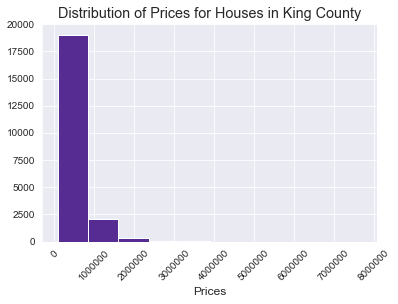

In [3]:
# sns.distplot(df['price'])
df['price'].hist()
plt.title('Distribution of Prices for Houses in King County', fontsize='x-large')
plt.xticks(rotation='45')
plt.xlabel('Prices', fontsize='large')
plt.show()

This made it clear that while most dwellings were below 1,000,000, there were some that were incredibly expensive. We were interested in the trends among the majorit of the population, and the incredible inequality these creatures seem to willingly endure had to be eliminated from our data so we could see the greater mass of them. 

We did this by cutting off the top %2.6 of the high prices. We also normalized the data by performing a log transformation.

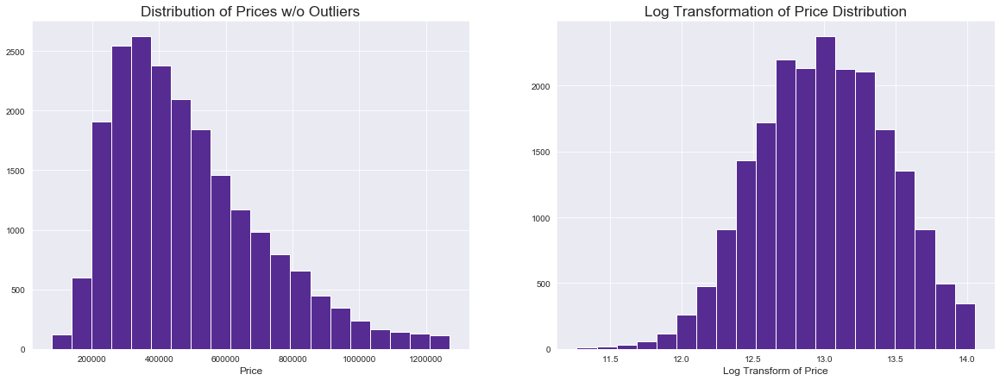

In [4]:
df = df.drop(df.loc[df['price'] > np.mean(df['price']) + (2 * np.std(df['price']))].index)
df['price_log'] = df['price'].map(lambda x: np.log(x))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
ax1.hist(df['price'], bins=20)
ax2.hist(df['price_log'], bins=20)
ax1.set_title('Distribution of Prices w/o Outliers', fontsize='xx-large')
ax1.set_xlabel('Price', fontsize='large')
ax2.set_title('Log Transformation of Price Distribution', fontsize='xx-large')
ax2.set_xlabel('Log Transform of Price', fontsize='large')
plt.show()

Since the price of a home was to be our guide to what these aliens value, it was important that it be cleaned up nicely. With that done, we could turn to look at other features of our dataset. The first step here was to simply see how each feature correlated with others, so that we could identify those that might correlate well with the price. 

In [5]:
df.corr()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_log
id,1.000000,0.001804,0.006867,0.018209,0.000903,-0.133675,0.026581,0.003268,0.020481,-0.024203,0.025320,0.002925,0.024105,-0.013741,-0.004906,0.000922,0.020112,0.006869,-0.142692,0.012327
price,0.001804,1.000000,0.303167,0.469413,0.639734,0.092469,0.277749,0.057548,0.268228,0.035227,0.648951,0.546257,0.061722,0.086193,-0.023722,0.414984,0.066017,0.579969,0.082841,0.962057
bedrooms,0.006867,0.303167,1.000000,0.497440,0.585192,0.027458,0.159826,-0.029787,0.043425,0.024070,0.328124,0.467454,0.161533,0.002774,-0.149701,-0.024839,0.140449,0.375341,0.024669,0.307284
bathrooms,0.018209,0.469413,0.497440,1.000000,0.723533,0.069268,0.503152,-0.005006,0.107699,-0.137745,0.622686,0.646387,0.539380,0.024604,-0.206039,-0.001205,0.247751,0.535567,0.069612,0.479893
sqft_living,0.000903,0.639734,0.585192,0.723533,1.000000,0.162468,0.343993,-0.000884,0.185490,-0.074107,0.718319,0.857486,0.350898,0.021421,-0.203828,0.021239,0.283201,0.743393,0.175253,0.621583
sqft_lot,-0.133675,0.092469,0.027458,0.069268,0.162468,1.000000,-0.015594,0.019357,0.073219,-0.004040,0.097449,0.167436,0.044740,0.007510,-0.130251,-0.093284,0.224347,0.143363,0.710868,0.091036
floors,0.026581,0.277749,0.159826,0.503152,0.343993,-0.015594,1.000000,-0.006629,-0.008007,-0.274706,0.457503,0.528708,0.505995,-0.001899,-0.063702,0.039511,0.134037,0.270424,-0.019941,0.293939
waterfront,0.003268,0.057548,-0.029787,-0.005006,-0.000884,0.019357,-0.006629,1.000000,0.255253,0.010614,-0.007568,-0.011165,-0.032325,0.057094,0.034217,-0.037380,-0.048645,0.010236,0.025350,0.048508
view,0.020481,0.268228,0.043425,0.107699,0.185490,0.073219,-0.008007,0.255253,1.000000,0.034940,0.151487,0.080497,-0.065705,0.066803,0.098869,-0.020161,-0.075573,0.204424,0.070933,0.238572
condition,-0.024203,0.035227,0.024070,-0.137745,-0.074107,-0.004040,-0.274706,0.010614,0.034940,1.000000,-0.168200,-0.177399,-0.355606,-0.053894,-0.003933,-0.018020,-0.101589,-0.116026,0.000548,0.032868


It seemed like the squarefootage of the living area, the grade given to it by a rating agency, and, oddly enough, the squarefootage of their neighbors were most correlated with the price. We looked at the square footage numbers, eliminated outliers, and log transformed them as well. The grade was strongly correlated with both of these, such that using it as well would yield a lot of multicollinearity. So we did not deal with the grade column as yet.

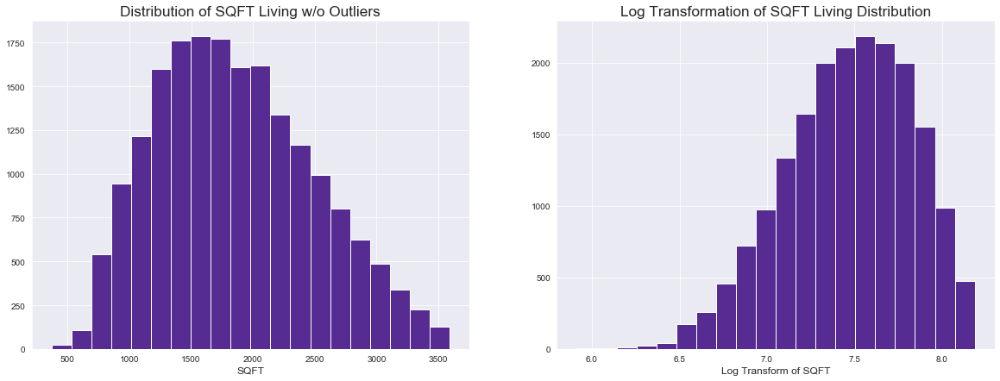

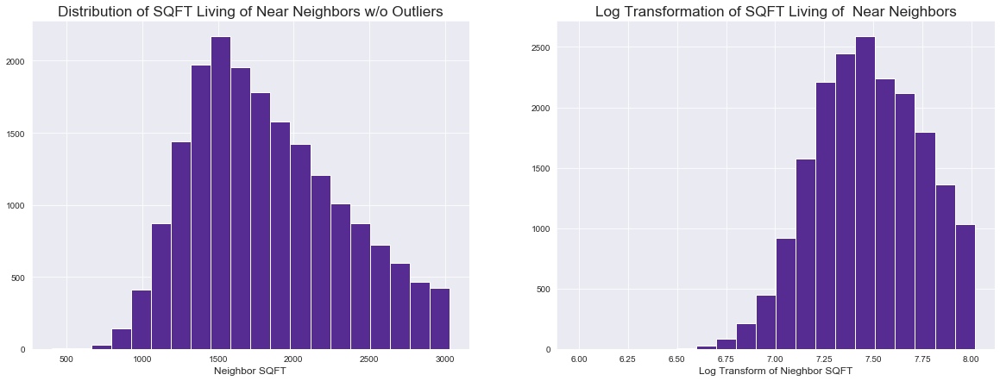

In [6]:
df = df.drop(df.loc[df['sqft_living'] > np.mean(df['sqft_living']) + (2 * np.std(df['sqft_living']))].index)
df = df.drop(df.loc[df['sqft_living15'] > np.mean(df['sqft_living15']) + (2 * np.std(df['sqft_living15']))].index)

df['sqft_living_log'] = df['sqft_living'].map(lambda x: np.log(x))
df['sqft_living15_log'] = df['sqft_living15'].map(lambda x: np.log(x))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
ax1.hist(df['sqft_living'], bins=20)
ax2.hist(df['sqft_living_log'], bins=20)
ax1.set_title('Distribution of SQFT Living w/o Outliers', fontsize='xx-large')
ax1.set_xlabel('SQFT', fontsize='large')
ax2.set_title('Log Transformation of SQFT Living Distribution', fontsize='xx-large')
ax2.set_xlabel('Log Transform of SQFT', fontsize='large')
plt.show()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
ax1.hist(df['sqft_living15'], bins=20)
ax2.hist(df['sqft_living15_log'], bins=20)
ax1.set_title('Distribution of SQFT Living of Near Neighbors w/o Outliers', fontsize='xx-large')
ax1.set_xlabel('Neighbor SQFT', fontsize='large')
ax2.set_title('Log Transformation of SQFT Living of  Near Neighbors', fontsize='xx-large')
ax2.set_xlabel('Log Transform of Nieghbor SQFT', fontsize='large')
plt.show()

At this point, we felt we had a good few indicators. But simply the size of their space would not tell us much about these humans' preferences. So we looked at our data and sculpted some more features. It seemed interesting, for example, to find out whether they liked to live below ground or instead favored living spaces high above the ground. We also tracked whether the house was newly remodelled, and how much empty space existed around it.

In [7]:
# making the basement column numeric, dropping the few unknown basement values
df = df.drop(df.loc[df['sqft_basement'] == '?'].index)
df['sqft_basement'] = pd.to_numeric(df['sqft_basement'])

# making basement column categorical
df['has_basement'] = df['sqft_basement'].map(lambda x: 1 if x > 0 else 0)

# marking which houses had space high above the ground
df['high_floors'] = df['floors'].map(lambda x: 0 if x < 2 else 1)

# marking which houses have renovations
df['has_renovation'] = df['yr_renovated'].map(lambda x: 0 if x > 0 else 1)

# tracking empty lot space
df['surrounding_space'] = df['sqft_lot'] - (df['sqft_above'] / df['floors'])
df['surrounding_space_log'] = df['surrounding_space'].map(lambda x: np.log(x))

With the data thus organized, we were able to begin answering some of the questions raised by our Comission in the course of its investigations. In what follows, we will look at the questions below one by one:

1. Do humans prefer to live near water or to live more inland where it is safer?
2. Do humans like to have a lot of empty land around them?
3. Do humans like to live high above the ground?
4. Do humans enjoy living deep below the ground?
5. Do humans use their eyes for pleasure or only survival?

To answer these, we make use of a many different columns in our data, while also tracking these features against the overall price of the home. 

### 1. Do Humans Prefer Living Near Water?

To answer this question, we will see what proportion of high-price homes are near water. If the proportion of high-price homes near water is higher than the proportion of low-price homes near water, this will tell us that humans enjoy the water and tend to pay extra for it. 

In [8]:
# first, split the price data into quartiles
first_q, second_q, third_q = df['price'].quantile([.25, .5, .75])
df['price_quartile'] = df['price'].map(lambda x: 1 if x < first_q 
                                                else 2 if first_q <= x < second_q 
                                                else 3 if second_q <= x < third_q 
                                                else 4)

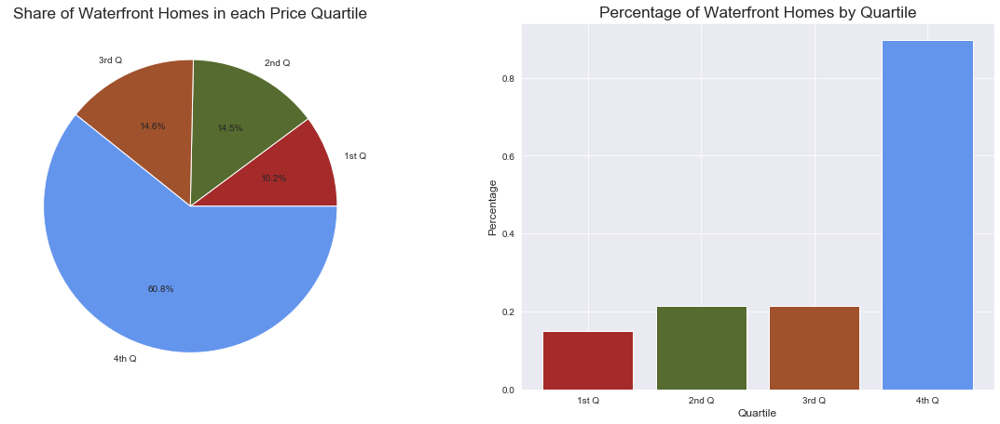

In [9]:
# make a dictionary of quartiles and the percentage of waterfront homes in that quartile
quartile_percent_waterfront = {}
for i in [1, 2, 3, 4]:
    quartile = df.loc[df['price_quartile'] == i]
    quartile_percent_waterfront[i] = (len(quartile.loc[df['waterfront'] == 1]) / len(quartile)) * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7.25))
ax2 = plt.bar(x=quartile_percent_waterfront.keys(), height=quartile_percent_waterfront.values(), tick_label=['1st Q', '2nd Q', '3rd Q', '4th Q'], color=['brown', 'darkolivegreen', 'sienna','cornflowerblue'])
plt.title('Percentage of Waterfront Homes by Quartile', fontsize='xx-large')
plt.xlabel('Quartile', fontsize='large')
plt.ylabel('Percentage', fontsize='large')
ax1.pie(quartile_percent_waterfront.values(), labels=['1st Q', '2nd Q', '3rd Q', '4th Q'], colors=['brown', 'darkolivegreen', 'sienna','cornflowerblue'], autopct='%1.1f%%')
ax1.set_title('Share of Waterfront Homes in each Price Quartile', fontsize='xx-large')
plt.show()

From this, we can see that the vast majority of houses near water are valued quite highly by these creatures. This is odd given how dangerous and volatile liquid water is. Perhaps the humans have some sort of risk-seeking tendencies still remaining in their genetic sequences. 

Unfortunately for them (though perhaps fortunately for their species), not many homes can actually exist by the water (only about .35% of them). The homes that do, however, are highly sought after.

### 2. Do Humans Enjoy Having Empty Land Around Them?

Here we compare the empty space in a dwelling-place's lot to the price of the dwelling itself. But before looking at that connection itself, look at the distribution of surrounding space in general. 

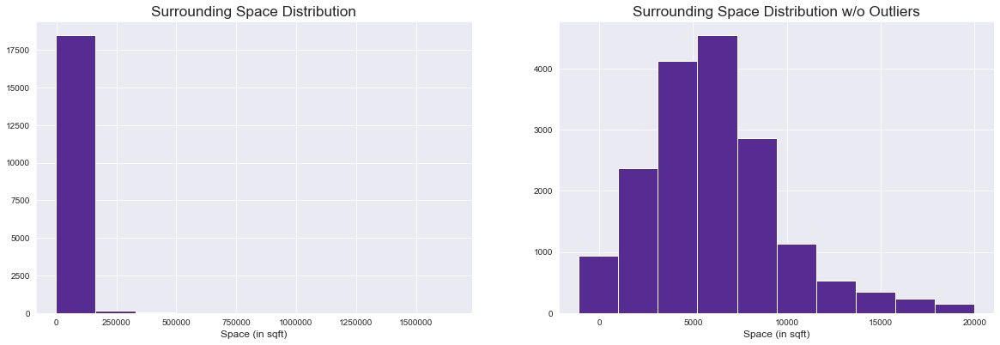

The average amount of space surrounding a home is 6134 sqft


In [10]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6.25))
ax1.hist(df['surrounding_space'])
ax1.set_xlabel('Space (in sqft)', fontsize='large')
ax1.set_title('Surrounding Space Distribution', fontsize='xx-large')
df2 = df.drop(df.loc[df['surrounding_space'] > 20000].index)
ax2.hist(df2['surrounding_space'])
ax2.set_title('Surrounding Space Distribution w/o Outliers', fontsize='xx-large')
ax2.set_xlabel('Space (in sqft)', fontsize='large')
plt.show()

print('The average amount of space surrounding a home is ' + str(round(df2['surrounding_space'].mean())) + ' sqft')

As is evident, just as was the case with prices, there are a few houses with an enormous surrounding space. Once we control for those, however, we can get a clearer picture. It seems that most humans live with about 5000 sqft of surrounding space around their homes. Note however, that this distribution occured after we excluded many of the high-priced dwellings, so we already have a hint that large space does not correspond with large prices.

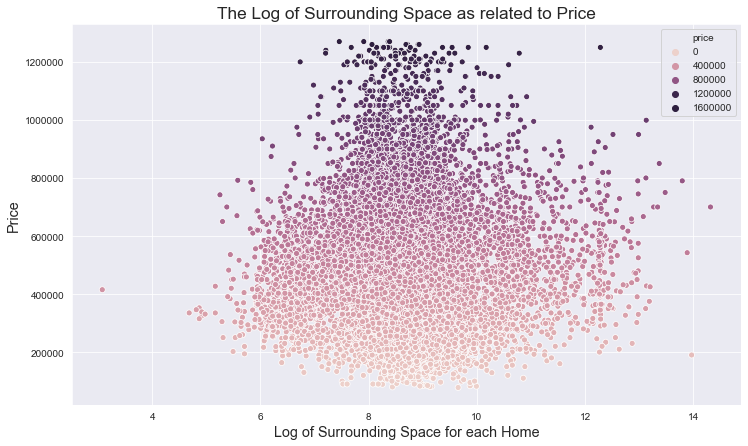

In [11]:
fig, ax = plt.subplots(figsize=(12, 7))
ax = sns.scatterplot(data=df, x='surrounding_space_log', y='price', hue='price')
ax.set_title('The Log of Surrounding Space as related to Price', fontsize='xx-large')
ax.set_xlabel('Log of Surrounding Space for each Home', fontsize='x-large')
ax.set_ylabel('Price', fontsize='x-large')
plt.show()

As is visible from the very clustered but also blob-esque data, there is no real connection between the price of a home and surrounding space. Humans do not value extra space around their homes enough to pay extra for it at any significant rate. 

One might find this odd - without extra space, where will the humans keep their various pets and beasts of burden? Recall, however, that the keeping of personal menageries is quite rare among humans, and that they generally rely on electrified metals rather than living beings to aid them in their labors. Hopefully one day they will learn the error of their ways.

### 3. Do Humans Like to Live High Above Ground?

This question is closely related to the question regarding the human desire to be near water. In their homes, these creatures have taken the art of stacking living spaces to great heights (pardon the pun). Again in an illustration of their desire for risk, or perhaps as a residual instinct from their days as tree-dwelling primates, they often build dwellings that tower over the ground with no regard for safety. 

Below we examine how much a human is willing to expend their finite resources in order to procure a home of great height. Height here is measured in floors - a tall home is one with more than two floors.

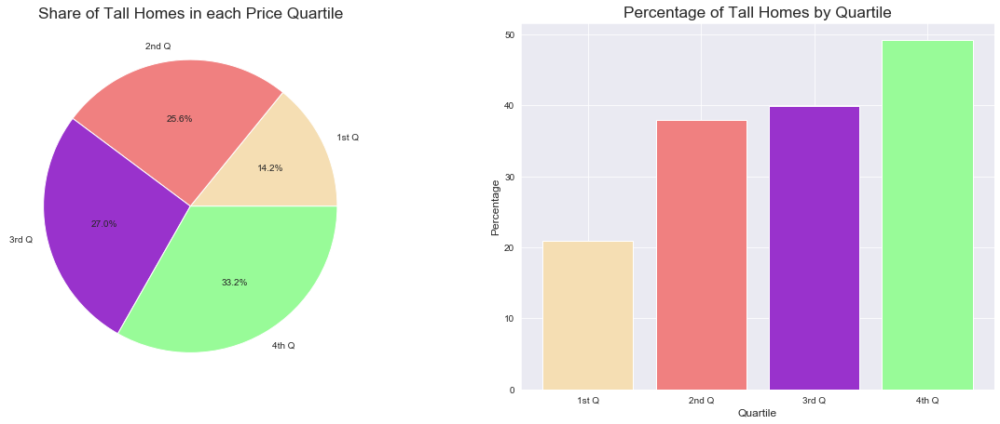

In [12]:
quartile_percent_floors = {}
for i in [1, 2, 3, 4]:
    quartile = df.loc[df['price_quartile'] == i]
    quartile_percent_floors[i] = (len(quartile.loc[df['high_floors'] == 1]) / len(quartile)) * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7.25))
ax2 = plt.bar(x=quartile_percent_floors.keys(), height=quartile_percent_floors.values(), tick_label=['1st Q', '2nd Q', '3rd Q', '4th Q'], color=['wheat', 'lightcoral', 'darkorchid','palegreen'])
plt.title('Percentage of Tall Homes by Quartile', fontsize='xx-large')
plt.xlabel('Quartile', fontsize='large')
plt.ylabel('Percentage', fontsize='large')
ax1.pie(quartile_percent_floors.values(), labels=['1st Q', '2nd Q', '3rd Q', '4th Q'], colors=['wheat', 'lightcoral', 'darkorchid','palegreen'], autopct='%1.1f%%')
ax1.set_title('Share of Tall Homes in each Price Quartile', fontsize='xx-large')
plt.show()

Here there is a less clear effect as there was in the case of waterfront properties. Only those willing to spend relatively large amounts of resources are able to procure homes with multiple stories. The biggest difference comes in Indeed, as the price goes up, a greater and greater percentage of homes are blessed with multiple floors. Based on their preference for risky home locations, the most rich humans clearly have a great subconscious desire to end their lives, no doubt because the extreme inequality of their position creates in them great resevoirs of guilt.

### 4. Do Humans Enjoy Living Deep Below the Ground?

We saw in the last question that humans love to eat, sleep, and live far above the ground, to the point that they are willing to spend what few resources they have in order to procure these risky homes. This in itself might seem to answer the question of whether they like to live below the ground in what they call 'basements,' but humans are nothing if not contradictory. 

We can generate similar graphs to examine their preferences with regard to living underground. Note that we use the categorical feature of whether or not a house has a basement, rather than the size of the basement; the size of basement did not have any real 


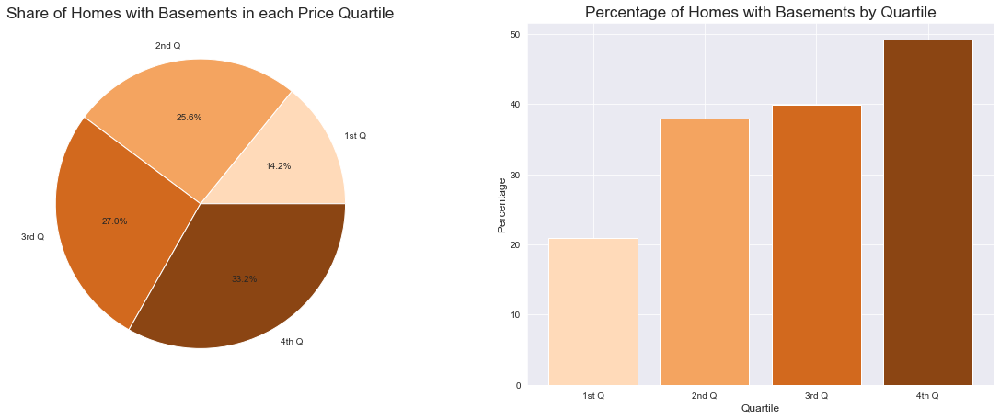

In [13]:
quartile_percent_basement = {}
for i in [1, 2, 3, 4]:
    quartile = df.loc[df['price_quartile'] == i]
    quartile_percent_basement[i] = (len(quartile.loc[df['high_floors'] == 1]) / len(quartile)) * 100

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7.25))
ax2 = plt.bar(x=quartile_percent_basement.keys(), height=quartile_percent_basement.values(), tick_label=['1st Q', '2nd Q', '3rd Q', '4th Q'], color=['peachpuff','sandybrown', 'chocolate', 'saddlebrown'])
plt.title('Percentage of Homes with Basements by Quartile', fontsize='xx-large')
plt.xlabel('Quartile', fontsize='large')
plt.ylabel('Percentage', fontsize='large')
ax1.pie(quartile_percent_basement.values(), labels=['1st Q', '2nd Q', '3rd Q', '4th Q'], colors=['peachpuff','sandybrown', 'chocolate', 'saddlebrown'], autopct='%1.1f%%')
ax1.set_title('Share of Homes with Basements in each Price Quartile', fontsize='xx-large')
plt.show()

Oddly enough, in addition to enjoying high spaces, humans love to go into the dark holes of their planet. This should encourage us to examine what the heights and the ground have in common. Perhaps once they get their fill of life-threatening heights, they like to retreat to the depths to sleep for the night in safety. 

At any rate, when we consider a full model to discover how much a domicile might be valued by these aliens, we should include whether it has any space below their Earth.

### 5. How Important is the Sense of Sight to Humans?

Unlike us, humans have a fascinating capacity to sense radiation coming from nearby stars. They do this with an organ they call the 'eye.' This organ initially evolved as a way to detect predators and navigate the environment, but some argue that it is not used for this purpose alone. My esteemed colleague Ävsæõni, in his paper 'Human Radiation Sensitivy and Pleasure Thresholds,' claims that some humans use this organ simply as a way of deriving pleasure. They turn their eyes to absorb radiation from reflecting off of different objects, and find certain patterns of reflected radiation pleasurable. 

This hypothesis regarding the human eye can be put to the test. If humans as a species take pleasure from certain patterns of radiation, they should preferentially spend money on houses which enable such radiation reception. In the data we collected, the beauty of a radiation pattern was ranked in a category called 'view.' We chart that below to see if there is any connection between the view rating and a human's valuation of the house.

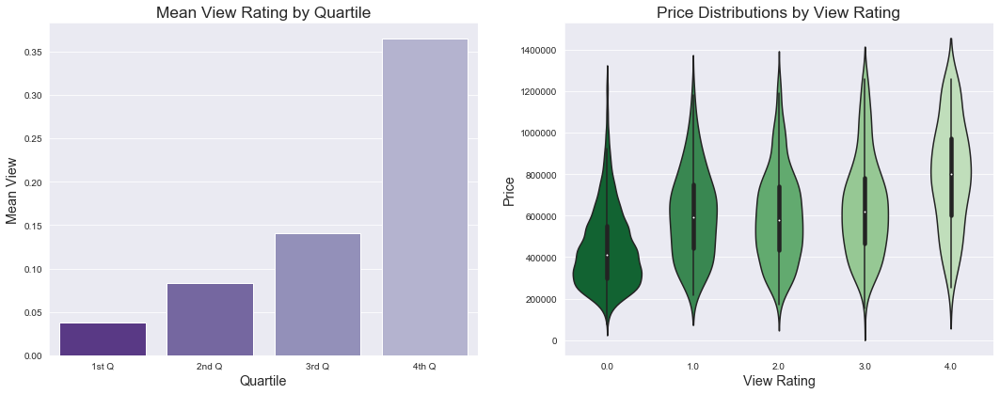

In [34]:
mean_view_dict = {}
for i in [1, 2, 3, 4]:
    quartile = df.loc[df['price_quartile'] == i]
    mean_view_dict[i] = quartile['view'].mean()

fig, axs = plt.subplots(ncols=2, figsize=(18, 6.5))
sns.barplot(x=list(mean_view_dict.keys()), y=list(mean_view_dict.values()), tick_label=['1st Q', '2nd Q','3rd Q', '4th Q'], ax=axs[0])
axs[0].set_title('Mean View Rating by Quartile', fontsize='xx-large')
axs[0].set_xlabel('Quartile', fontsize='x-large')
axs[0].set_xticklabels(['1st Q', '2nd Q','3rd Q', '4th Q'])
axs[0].set_ylabel('Mean View', fontsize='x-large')
palette = sns.color_palette('Greens')
palette.reverse()
sns.set_palette(palette)
sns.violinplot(x=df['view'], y=df['price'], dataset=df, ax=axs[1])
axs[1].set_title('Price Distributions by View Rating', fontsize='xx-large')
axs[1].set_xlabel('View Rating', fontsize='x-large')
axs[1].set_ylabel('Price', fontsize='x-large')
plt.show()

palette = sns.color_palette("Purples")
palette.reverse()
sns.set_palette(palette)

The charts here corrobarate Ävsæõni's conclusion; humans do seem to prefer dwellings which afford them the opportunity for pleasurable reception of radiation through their eyes. The chart on the left indicates that the average view rating of the most sought-after dwellings is much higher than that of those less dear. The chart on the right shows that while there is a large range of prices for any view rating, prices at lower ratings are clustered quite low, while those at a high rating we see the price reach its highest average.

These findings indicate a set of relevant features that could be used to indicate an overall valuation of a home. These features are:
- the home's proximity to a body of water
- the home's overall height
- the presence of subterranean spaces in the home
- the home's ability to receive radiation in a way human eyes find pleasant
- the home's size 

In the concluding parts of this presentation on human housing preferences, we build a multiple regression model to capture all of these features.

## Building a Multiple Regression Model

Going into building our model, we had a few features we felt would be reasonable to include. Still, we wanted to be sure to include everything we could, so we went through a couple different models on our way to a final result. 

In [15]:
# get dummy values for some categorical variables
view_dummies = pd.get_dummies(df['view'], prefix='view')
df = pd.concat([df, view_dummies], axis=1)
grade_dummies = pd.get_dummies(df['grade'], prefix='grade')
df = pd.concat([df, grade_dummies], axis=1)
condition_dummies = pd.get_dummies(df['condition'], prefix='condition')
df = pd.concat([df, condition_dummies], axis=1)

In [16]:
# our first pass simply used almost every feature in the data set
feature_list = ['bedrooms', 'bathrooms', 'sqft_living','sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade','sqft_above',              'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 
       'sqft_living_log', 'sqft_living15_log', 'has_basement', 'high_floors', 'has_renovation', 'surrounding_space',                    'view_1.0', 'view_2.0', 'view_3.0', 'view_4.0', 'grade_3', 'grade_4', 'grade_5', 'grade_6','grade_7', 'grade_8',                 'grade_9', 'grade_10', 'condition_2', 'condition_3', 'condition_4','condition_5']
human_model1 = build_sm_ols(df, list(feature_list), 'price_log')

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.694
Model:                            OLS   Adj. R-squared:                  0.693
Method:                 Least Squares   F-statistic:                     1208.
Date:                Thu, 08 Oct 2020   Prob (F-statistic):               0.00
Time:                        09:34:59   Log-Likelihood:                 133.31
No. Observations:               18676   AIC:                            -194.6
Df Residuals:                   18640   BIC:                             87.44
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P&gt;|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
bedrooms             -0.0204      0

Obviously, this model suffered from a lot of problems. If we examine its multicollinearity through the VIF scores of its features, it demonstrates deep problems on that front:

In [17]:
check_vif_feature_space(df, feature_list, vif_threshold=3.0)

No multicollinearity detected for bedrooms.
No multicollinearity detected for bathrooms.
sqft_living surpassed threshold with vif=inf
sqft_lot surpassed threshold with vif=96675.53427247252
floors surpassed threshold with vif=11.80481647794958
No multicollinearity detected for waterfront.
view surpassed threshold with vif=inf
condition surpassed threshold with vif=inf
grade surpassed threshold with vif=inf
sqft_above surpassed threshold with vif=inf
sqft_basement surpassed threshold with vif=inf
No multicollinearity detected for yr_built.
yr_renovated surpassed threshold with vif=15396.456345598213
No multicollinearity detected for lat.
No multicollinearity detected for long.
sqft_living15 surpassed threshold with vif=52.631310044277534
No multicollinearity detected for sqft_lot15.
sqft_living_log surpassed threshold with vif=37.32499080772779
sqft_living15_log surpassed threshold with vif=50.783934422054806
has_basement surpassed threshold with vif=4.25136686849634
high_floors surpass

False

We can also plot the residuals to see if they are normally distributed; it did not succeed there either.

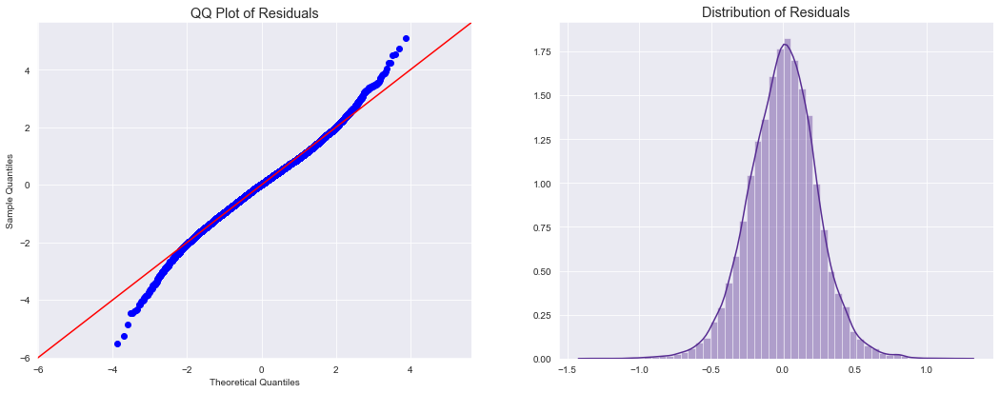

In [18]:
plot_residuals_and_qq(human_model1)

On our next pass we removed many of the multicollinear features, focusing on just sqft of living space and a few others. 

In [19]:
feature_list = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'yr_built', 'lat',
       'sqft_living_log', 'sqft_living15_log', 'has_basement', 'high_floors',  'view_1.0', 'view_2.0', 'view_3.0',          'view_4.0', 'grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11',                'condition_1','condition_2', 'condition_3', 'condition_4', ]
human_model2 = build_sm_ols(df, list(feature_list), 'price_log')

                                 OLS Regression Results                                
Dep. Variable:              price_log   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.680e+06
Date:                Thu, 08 Oct 2020   Prob (F-statistic):                        0.00
Time:                        09:35:05   Log-Likelihood:                         -1876.1
No. Observations:               18676   AIC:                                      3804.
Df Residuals:                   18650   BIC:                                      4008.
Df Model:                          26                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P&gt;|t|      [0.025      0.975]
-------------------------------

We can see how well this model meets our assumptions as well.

bedrooms surpassed threshold with vif=24.638437472808842
bathrooms surpassed threshold with vif=28.250808353664617
floors surpassed threshold with vif=53.87807523271062
No multicollinearity detected for waterfront.
yr_built surpassed threshold with vif=7965.386639024582
lat surpassed threshold with vif=21872.88618594952
sqft_living_log surpassed threshold with vif=1660.1522620770897
sqft_living15_log surpassed threshold with vif=1570.807166491273
No multicollinearity detected for has_basement.
high_floors surpassed threshold with vif=11.924688855086275
No multicollinearity detected for view_1.0.
No multicollinearity detected for view_2.0.
No multicollinearity detected for view_3.0.
No multicollinearity detected for view_4.0.
grade_4 surpassed threshold with vif=25.386314533043556
grade_5 surpassed threshold with vif=213.5108303370691
grade_6 surpassed threshold with vif=182.30898121202227
No multicollinearity detected for grade_7.
grade_8 surpassed threshold with vif=29.191655546766263

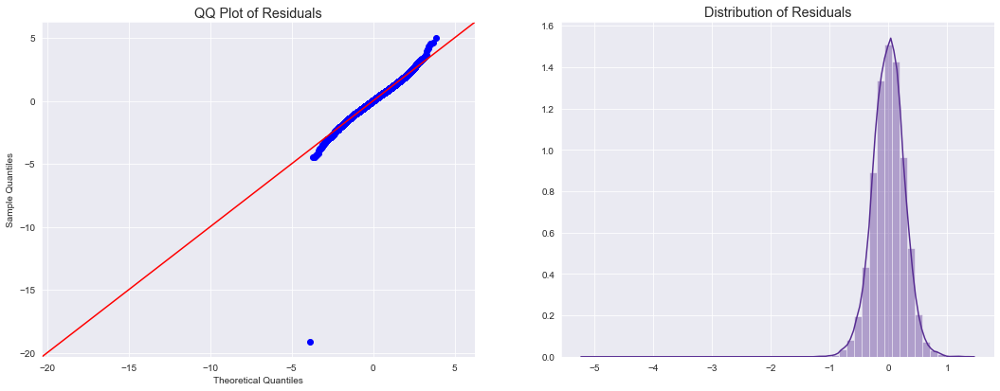

In [20]:
check_vif_feature_space(df, feature_list, vif_threshold=3.0)
plot_residuals_and_qq(human_model2)

While the distrubtion of the residuals was a little better, we still had a lot of multicollinearity. Our next model eliminated a many of the categorical features we had been using,since they seemed to be a major part of that collinearity. 

In [21]:
feature_list = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'yr_built', 'lat', 'sqft_living_log', 'sqft_living15_log', 'has_basement',        'high_floors',  'view_1.0', 'view_2.0', 'view_3.0','view_4.0']
human_model3 = build_sm_ols(df, list(feature_list), 'price_log')

                                 OLS Regression Results                                
Dep. Variable:              price_log   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          2.455e+06
Date:                Thu, 08 Oct 2020   Prob (F-statistic):                        0.00
Time:                        09:35:11   Log-Likelihood:                         -4117.0
No. Observations:               18676   AIC:                                      8262.
Df Residuals:                   18662   BIC:                                      8372.
Df Model:                          14                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P&gt;|t|      [0.025      0.975]
-------------------------------

Again, we tested the multicollinearity and normality assumptions.

bedrooms surpassed threshold with vif=24.069667481997005
bathrooms surpassed threshold with vif=27.500956321048797
floors surpassed threshold with vif=52.68919143032823
No multicollinearity detected for waterfront.
yr_built surpassed threshold with vif=7098.159744330341
lat surpassed threshold with vif=7812.974561556637
sqft_living_log surpassed threshold with vif=1500.9876329162505
sqft_living15_log surpassed threshold with vif=1474.3559976539527
No multicollinearity detected for has_basement.
high_floors surpassed threshold with vif=11.800162901103766
No multicollinearity detected for view_1.0.
No multicollinearity detected for view_2.0.
No multicollinearity detected for view_3.0.
No multicollinearity detected for view_4.0.


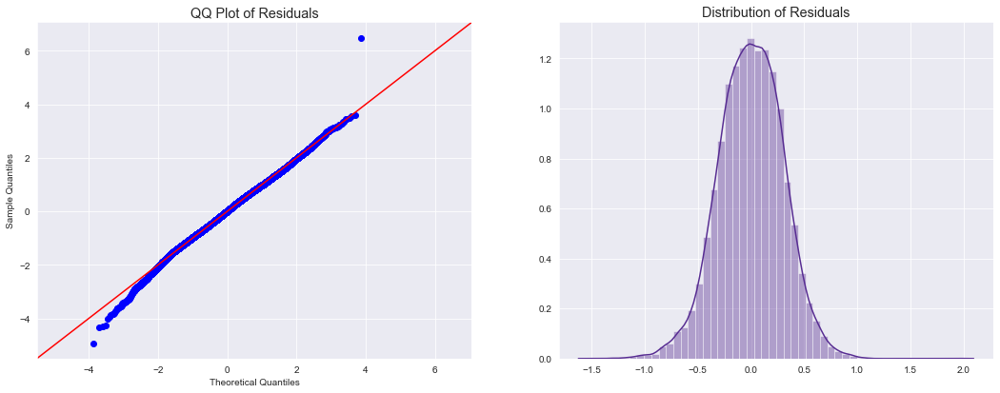

In [22]:
check_vif_feature_space(df, feature_list, vif_threshold=3.0)
plot_residuals_and_qq(human_model3)

The residuals seem ok, with perhaps a few outliers, but the multicollinearity got even worse! At this point, we dropped a number of features that we hadn't really explored, and instead turned to those we knew the humans enjoyed.

In [23]:
feature_list = ['waterfront', 'sqft_living_log', 'sqft_living15_log', 'has_basement', 'high_floors', 'view_1.0', 'view_2.0', 'view_3.0',           'view_4.0']
human_model4 = build_sm_ols(df, list(feature_list), 'price_log')

                                 OLS Regression Results                                
Dep. Variable:              price_log   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          1.844e+06
Date:                Thu, 08 Oct 2020   Prob (F-statistic):                        0.00
Time:                        09:35:16   Log-Likelihood:                         -10912.
No. Observations:               18676   AIC:                                  2.184e+04
Df Residuals:                   18667   BIC:                                  2.191e+04
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P&gt;|t|      [0.025      0.975]
-------------------------------

The tests, again:

No multicollinearity detected for waterfront.
sqft_living_log surpassed threshold with vif=909.0577748574038
sqft_living15_log surpassed threshold with vif=876.5135238740312
No multicollinearity detected for has_basement.
No multicollinearity detected for high_floors.
No multicollinearity detected for view_1.0.
No multicollinearity detected for view_2.0.
No multicollinearity detected for view_3.0.
No multicollinearity detected for view_4.0.


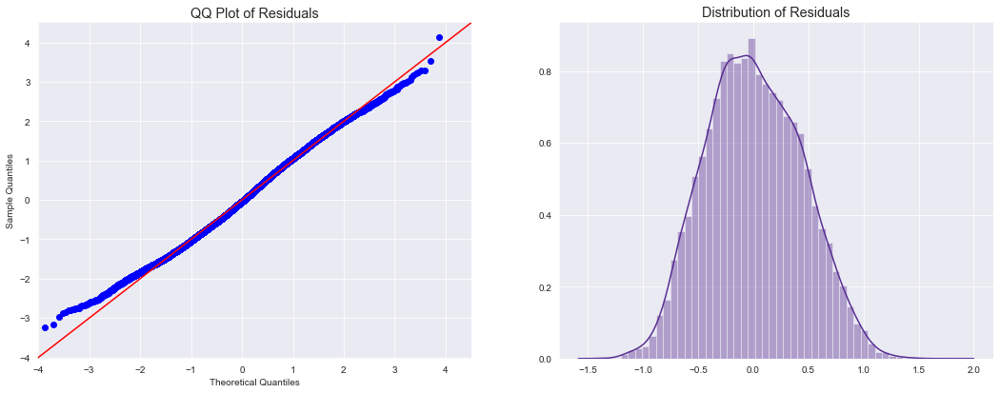

In [24]:
check_vif_feature_space(df, feature_list, vif_threshold=3.0)
plot_residuals_and_qq(human_model4)

It seems like we're getting close, but we will have to choose to either look at the sqftage of a dwelling's neighbors or the sqftage of the dwelling itself. Apparently humans like to cluster their large homes together. Although this makes it difficult for those with large homes to demonstrate their power to those with smaller homes, it does create a kind of herd safety for those with larger houses. If larger houses correlate to greater resources, perhaps those with greater resources like to huddle together for safety against the masses of more impoverished people.

Our next models try both sqftage of the home and the sqftage of their neighbors in turn. We also eliminate one of the view categories. View_0 was already eliminated because it created perfect collinearity with the other categories, but it also was the most common view rating by far. By eliminating another view category, we prevent collinearity between high view ratings, and improve the p-score for all view ratings.

                                 OLS Regression Results                                
Dep. Variable:              price_log   R-squared (uncentered):                   0.999
Model:                            OLS   Adj. R-squared (uncentered):              0.999
Method:                 Least Squares   F-statistic:                          2.087e+06
Date:                Thu, 08 Oct 2020   Prob (F-statistic):                        0.00
Time:                        09:35:21   Log-Likelihood:                         -12104.
No. Observations:               18676   AIC:                                  2.422e+04
Df Residuals:                   18669   BIC:                                  2.428e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P&gt;|t|      [0.025      0.975]
-------------------------------

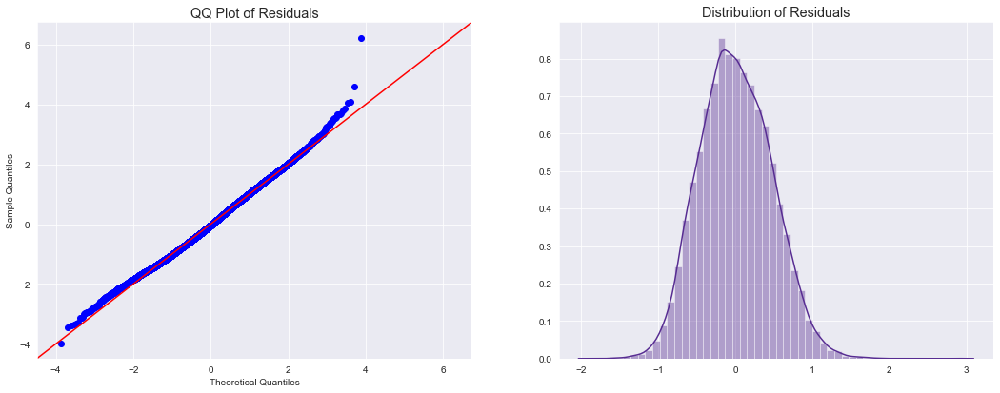

In [25]:
feature_list = ['waterfront', 'sqft_living15_log', 'has_basement', 'high_floors', 'view_1.0', 'view_2.0', 'view_4.0']
human_model5 = build_sm_ols(df, list(feature_list), 'price_log')
check_vif_feature_space(df, feature_list, vif_threshold=3.0)
plot_residuals_and_qq(human_model5)

                                 OLS Regression Results                                
Dep. Variable:              price_log   R-squared (uncentered):                   0.998
Model:                            OLS   Adj. R-squared (uncentered):              0.998
Method:                 Least Squares   F-statistic:                          1.689e+06
Date:                Thu, 08 Oct 2020   Prob (F-statistic):                        0.00
Time:                        09:35:27   Log-Likelihood:                         -14076.
No. Observations:               18676   AIC:                                  2.817e+04
Df Residuals:                   18669   BIC:                                  2.822e+04
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P&gt;|t|      [0.025      0.975]
---------------------------------

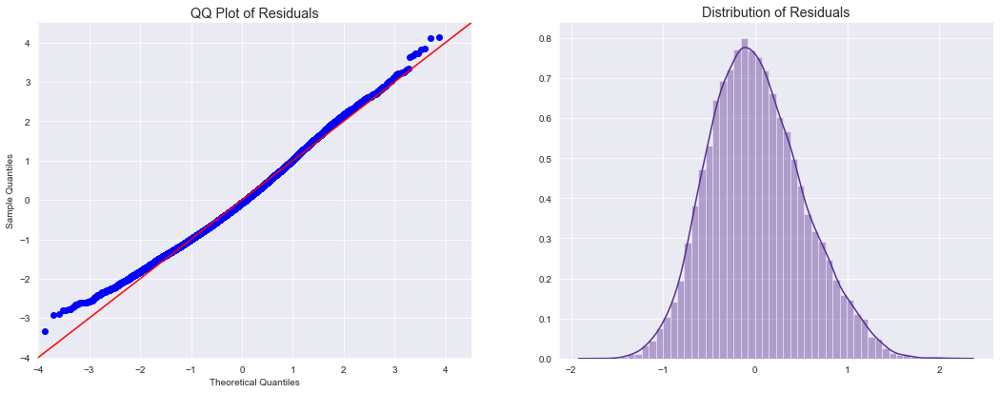

In [26]:
feature_list = ['waterfront', 'sqft_living_log', 'has_basement', 'high_floors', 'view_1.0', 'view_2.0', 'view_4.0']
human_model6 = build_sm_ols(df, list(feature_list), 'price_log')
check_vif_feature_space(df, feature_list, vif_threshold=3.0)
plot_residuals_and_qq(human_model6)

Overall, it appears that using the sqft of the living space itself is preferable to using the sqftage of their neighbors. That approach gives greater predictive power to the view variables, and also yields a more normal distribution, with relatively low skew and kurtosis.

At this point we can run more rigorous tests for normality. In particular, we run the K-S test and the Shapiro test. Since our distribution of residuals is so large, to get more accurate results we run these test on several randomly selected samples.

In [27]:
residuals = human_model6.resid
normal_dist = np.random.normal(residuals.mean(), np.std(residuals), 100)

residual_samples = []
for i in range(0, 200):
    sample = np.random.choice(residuals, 50)
    residual_samples.append(sample)

shapiro_fail_count = 0
ks_fail_count = 0
for sample in residual_samples:
    if scs.shapiro(sample)[1] < 0.05:
        shapiro_fail_count += 1
    if scs.ks_2samp(normal_dist, residuals)[1] < 0.05:
        ks_fail_count += 1

shapiro_fail_count, ks_fail_count        

(28, 0)

Here we can see that by and large, the normality requirement is satisfied; randomly sampled distributions pass the shapiro test about 90% of the time and the QQ plot and histogram of residuals look fairly good. 

What remains then is the homoskedasticity requirement on the model's residuals, and to check whether it is overfit or underfit by trying it on different folds of the data.

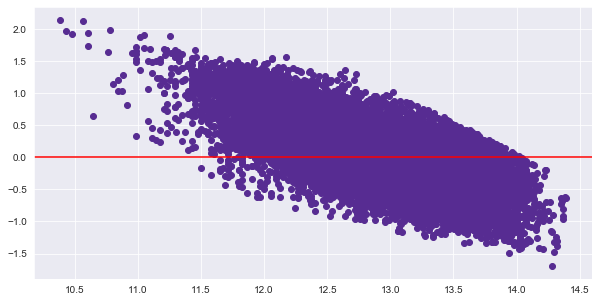

In [28]:
# test for heterskedacity
hetersked_plot(df, human_model6, 'price_log')

As we can see from the graph, the residuals from this model do not form a cone-like structure, and are relatively evenly spaced throughout. There does seem to be a kind of negative correlation among the residuals, but that does not necessarily undermine the homoskedacity. Since none of the other models had better residuals charts, this will have to do. 

We can also verify that the homoskedacity assumption is met by using the Goldfeld-Quandt test.

In [29]:
f_val, p_val, order = het_goldfeldquandt(human_model6.resid, human_model6.model.exog)
p_val

0.011023913960076171

The p-value of this test is well above 0.05. Since the null hypothesis is that the data is homoskedastically distributed, we fail to reject the null and can consider this assumption met.

Last, in order to make sure our model is not overfit or underfit, we run a cross-validation on it. 

In [30]:
# define the X and y
feature_df = df[feature_list]
X = feature_df
y = df['price_log']

In [31]:
# run a 5-fold cross validation on mean squared error
linreg = LinearRegression()
mse = make_scorer(mean_squared_error)

cv_5_results  = (cross_val_score(linreg, X, y, cv=5, scoring=mse))
print(f'The Mean Squared Error for each sample was {cv_5_results}, with an overall average of {round(cv_5_results.mean(), 3)}' )

The Mean Squared Error for each sample was [0.13281428 0.13126838 0.1305695  0.12923518 0.11262559], with an overall average of 0.127


The mean squared error for each of the 5 folds are relatively close together, which indicates that the model is not excessively over or under fit. This error value is also relatively small - 0.13 is only about 20% of a standard deviation in the log of price.

If we step back and look at our model, we can note a number of relevant features. First, the strongest coefficient was the one associated with the log of living space. As that number goes up, so too does the log of price. The coefficients of the basement and the high floors features were negative. This is a little surprising, since we know there is a positive correlation between these features and the price of homes. But their negative contribution here must be a sign of them balancing out some other feature, likely the living space one. Last, the view features did not contribute too much to our model, but they did do something, and their p-values indicate that they were reasonably significant. 

We found an overall positive relation between the features and the valuation of homes by humans, and relatively strong predictive capacity based on these features as well. Certainly there must be other things humans value in their dwelling-places, but to understand those would take a deeper understanding of their culture, which at this moment we do not possess.

## Summary and Conclusion

Thank you all for attending this presentation on the housing habits of the human aliens. Our overall conclusions are as follows:
- humans enjoy living near water
- humans enjoy living high above the ground
- humans also enjoy having space to live below the ground
- humans prefer larger homes, and their large homes are clustered together
- humans enjoy taking in certain patterns of radiation through their eyes

Our model combines these facts to generate a general value estimation for human homes. In the model it is the quantity of living space that is the strongest contributer to the overall prediction. Next to it waterfront properties and having a basement are also strong predictors. Overall, the model has strong predictive ability (r2 of .998) and fairly low MSE. At the same time, it satisfies the normality and collinearity conditions required of multiple linear regression. The homoskedasticity requirement it does not do as well on, but with the data given, it was does about as well as one could expect.

## Recommendations for Future Agents

1. Future agents should be placed in tall locations near water so that they can better attract humans. Indeed, this to some degree explains Agent Gates’ famous effectiveness  
2. Agents will need training on simulating/stimulating eye-pleasure in humans  
3. Once we pivot from observing to helping the humans, we should consider aerial bombardment to create craters and thus more water features for them to build houses near.



## Future Research

1. It would be interesting to look more at the connection between the view rating and a house's placement. What kinds of views do humans enjoy? Views of liquid water, other constructions, or simply of the sky?  
2. We'd like to explore other methods of modelling. The latitude feature seemed promising, and its connection to human housing desires may indicate that humans have some sort of magnetic sense that leads them to prefer certain latitudes over others. Unfortunately it had too much collinearity with other features for us to use it in our final model. Perhaps other kinds of models might be able to make better use of it.

I hope this has been an informative presentation. May your futures be filled with many grand excursions among the stars. Thank you.